### Streamline Plots

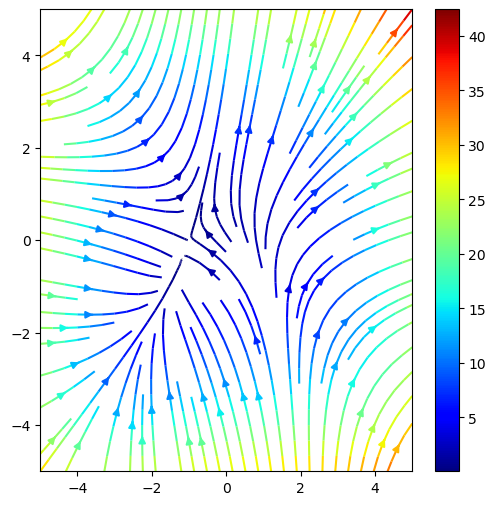

In [6]:
import numpy as np
import matplotlib.pyplot as plt

n = 5
x = np.linspace(-n,n,50)
y = np.linspace(-n,n,50)
X,Y = np.meshgrid(x,y)

U = X**2 + Y - 1 # U component of fluid vel
V = X + Y**2 + 1 # V component of fluid vel

plt.figure(figsize=(6,6))
fluid_streams = plt.streamplot(X,Y,U,V,color=np.sqrt(U**2+V**2),density=[1,1],cmap='jet')
plt.colorbar((fluid_streams).lines)
plt.show()

### Diesel Cycle

50.53487753053865


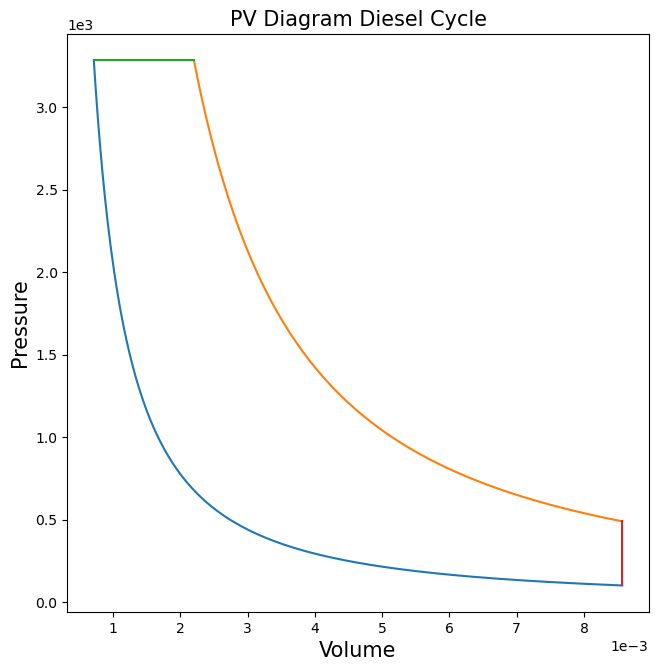

In [17]:
from numpy import sin,cos,pi
import numpy as np
import matplotlib.pyplot as plt

# inputs
d = 0.1   # bore
s = 0.1   # stroke
l = 0.15  # length of CR
r = 12    # Compression Ratio

P1 = 101.3
T1 = 300
gamma = 1.4
T3 = 2500 # maximum temperature of the cycle

def volume(d,s,l,r,theta):
    Vs = (pi/4)*d**2 # swept volume
    Vc = Vs/(r-1)    # clearance volume
    
    term1 = 1/(r-1)
    term2 = 1 + (2/s) - cos(theta)
    term3 = np.sqrt((2/s)**2 - (sin(theta))**2)

    V = Vs*(term1 + 0.5*(term2-term3))

    return V

Vs = (pi/4)*d**2
Vc = Vs/(r-1)

V1 = Vs+Vc
V2 = Vc
V4 = V1
T2 = T1*r**(gamma-1)
V3 = V2*(T3/T2)

# for compression adiabatic process - PV**gamma = constant
P2 = P1*(V1/V2)**gamma
P3 = P2
P4 = P3*(V3/V4)**gamma

theta = 0
while theta<pi:
    theta = theta + 0.001
    V_theta = volume(d,s,l,r,theta)
    if(0<(V_theta-V3)<0.001):
        break

print(theta*180/pi)

V_comp = volume(d,s,l,r,np.linspace(0,pi,180))
P_comp = P1*(V1/V_comp)**gamma

V_exp = volume(d,s,l,r,np.linspace(pi,theta,180))
P_exp = P3*(V3/V_exp)**gamma

plt.figure(figsize=(7.5,7.5))
plt.plot(V_comp,P_comp)
plt.plot(V_exp,P_exp)
plt.plot([V2,V3],[P2,P3])
plt.plot([V4,V1],[P4,P1])

plt.title("PV Diagram Diesel Cycle",fontsize=15)
plt.xlabel("Volume",fontsize=15)
plt.ylabel("Pressure",fontsize=15)
plt.ticklabel_format(style='sci',axis='x',scilimits=(0,0))
plt.ticklabel_format(style='sci',axis='y',scilimits=(0,0))

plt.show()

### One Dimensional Heat Equation

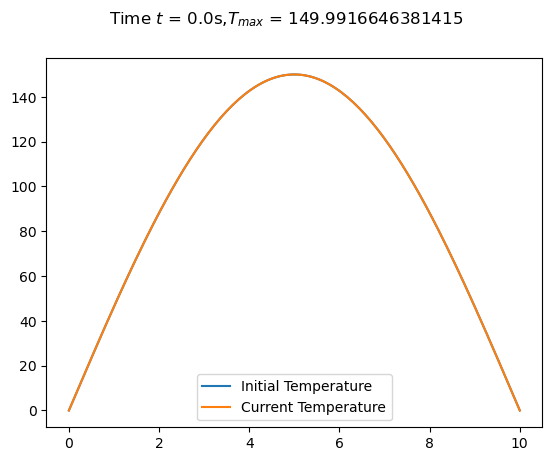

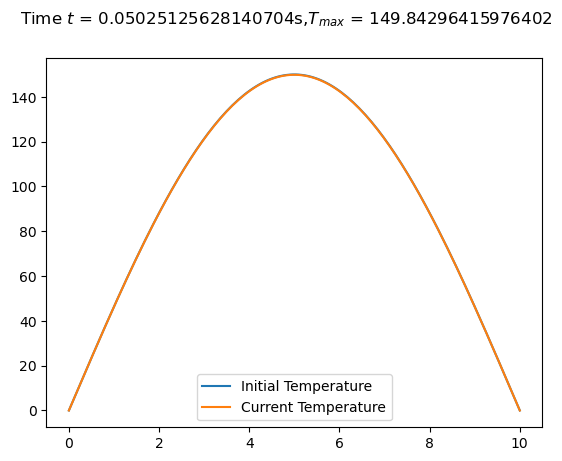

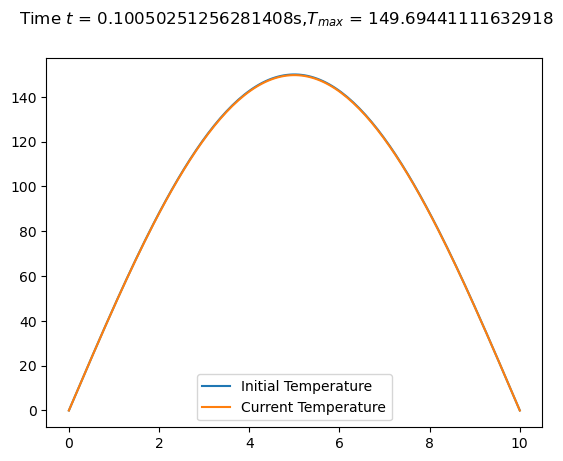

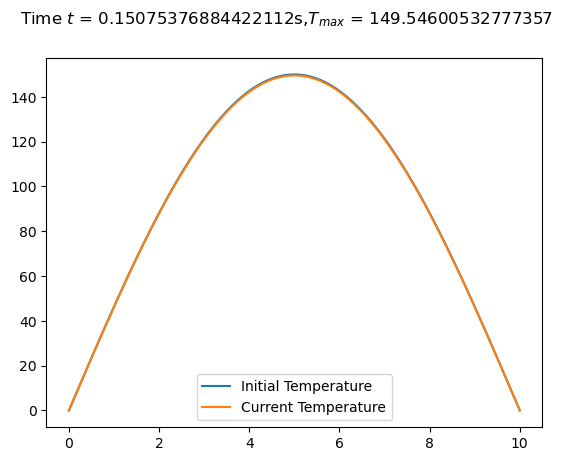

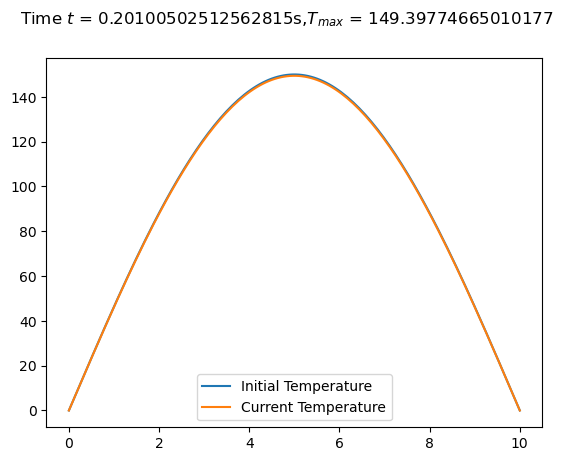

...

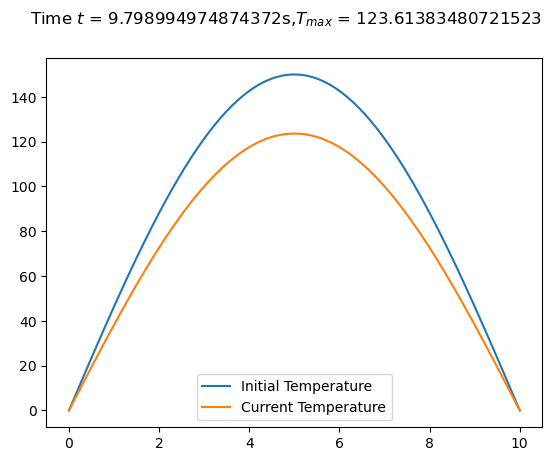

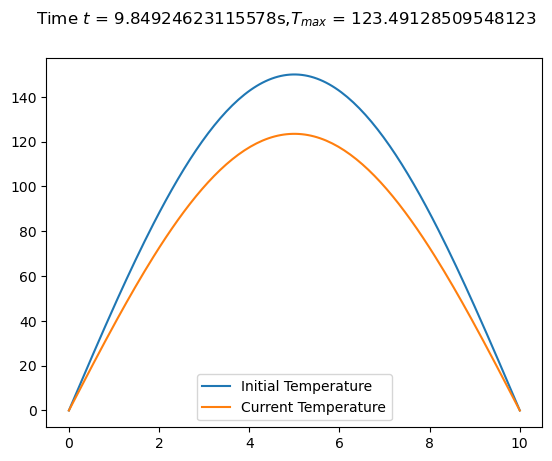

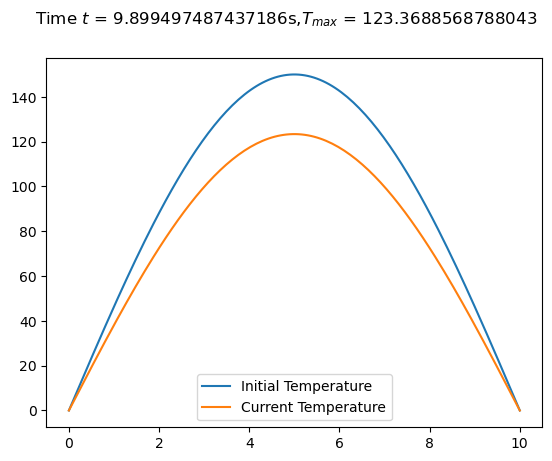

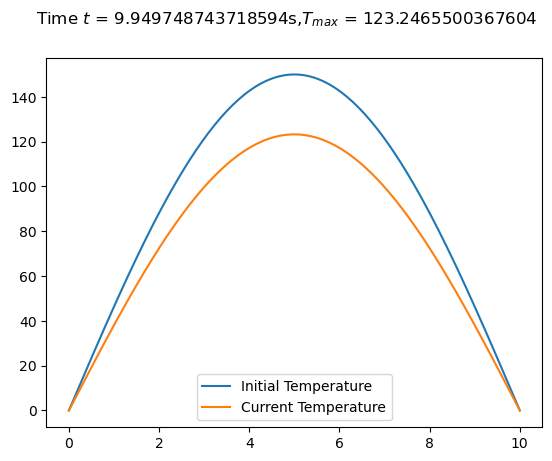

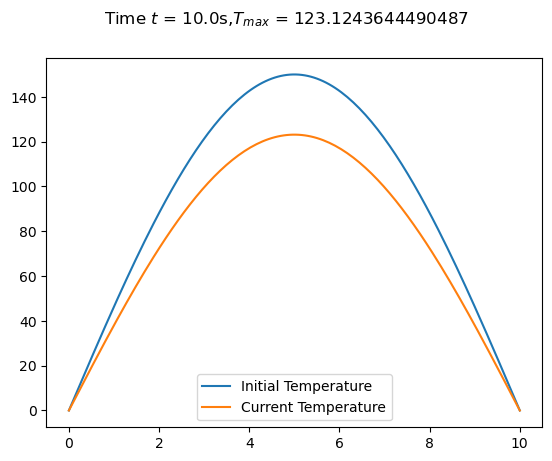

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint
from numpy import sin,cos,pi

L = 10 # length of the rod
nx = 150 # points along the length of the rod
Ts = 5 # simulation time
nt = 200 # number of time steps

x = np.linspace(0,L,nx)
k = 0.2
h = L/(nx-1)
dudt = []

def heat_eqn(u,t):
    dudt = np.ones(x.shape)
    dudt[0] = 0
    dudt[-1] = 0
    for i in range(1,nx-1):
        dudt[i] = k*(u[i-1] - 2*u[i] + u[i+1])/h**2
    return dudt

max_temp = 150
init_temp = np.ones(x.shape)*max_temp*sin(pi*x/L)
tspan = np.linspace(0,Ts,nt)
soln = odeint(heat_eqn,init_temp,tspan)

for j in range(len(tspan)):
    plt.clf()
    plt.plot(x,soln[0],label='Initial Temperature')
    plt.plot(x,soln[j],label='Current Temperature')
    heading = 'Time $t$ = '+str(tspan[j])+'s,$T_{max}$ = '+str(np.amax(soln[j]))
    plt.suptitle(heading)
    plt.title('1D Heat Equation')
    plt.xlabel('Length of Rod')
    plt.ylabel('Temperature')
    plt.grid()
    plt.xlim(0,L)
    plt.ylim(0,max_temp+10)

    plt.legend()
    plt.pause(0.1)

### Temperature Distribution - 2D Heat Transfer

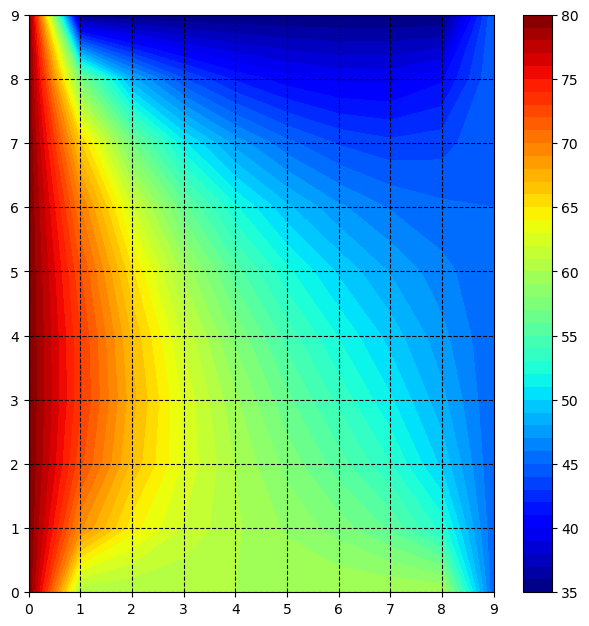

In [35]:
import numpy as np
import matplotlib.pyplot as plt

xdim = 10
ydim = 10

T1 = 80
T2 = 60
T3 = 45
T4 = 120

T_guess = 35
T = np.zeros((xdim,ydim))
T.fill(T_guess)
T[0:xdim,0] = T1
T[0,1:ydim] = T2
T[0:xdim,ydim-1] = T3
T[xdim-1,1]

niter = 80

for n in range(0,niter):
    for i in range(1,xdim-1,1):
        for j in range(1,ydim-1,1):
            T[i][j] = (T[i-1][j]+T[i+1][j] + T[i][j-1] + T[i][j+1])/4

plt.figure(figsize=(7.5,7.5))
plt.contourf(T,50,cmap='jet')
plt.grid(color='black',linestyle='--')
plt.colorbar()
plt.show()

### Flow Over Cylinder - Stream Line Plot

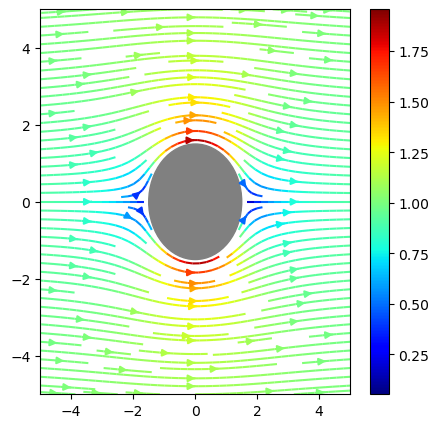

In [38]:
import numpy as np
import matplotlib.pyplot as plt
from numpy import sin,cos

x = np.linspace(-5,5,200) # gridsize
y = np.linspace(-5,5,200)
X,Y = np.meshgrid(x,y)

U = 1 # flow velocity
R = 1.5 # radius of the cylinder

r = np.sqrt(X**2+Y**2) # radial distance
theta = np.arctan(Y/X) # angle

Vr = U*(1-(R**2/r**2))*cos(theta)
Vt = -U*(1+(R**2/r**2))*sin(theta)

Vx = Vr*cos(theta) - Vt*sin(theta)
Vy = Vr*sin(theta) + Vt*cos(theta)

Vx[r<R] = np.nan
Vy[r<R] = np.nan

plt.figure(figsize=(5,5),dpi=100)
circle1 = plt.Circle((0,0),R,color='grey')
plt.gca().add_patch(circle1)

strplot = plt.streamplot(X,Y,Vx,Vy,color = np.sqrt(Vx**2+Vy**2),density=[1.5,1.5],cmap='jet')
plt.colorbar()
plt.show()

### Flow Over Cylinder - Pressure Distribution

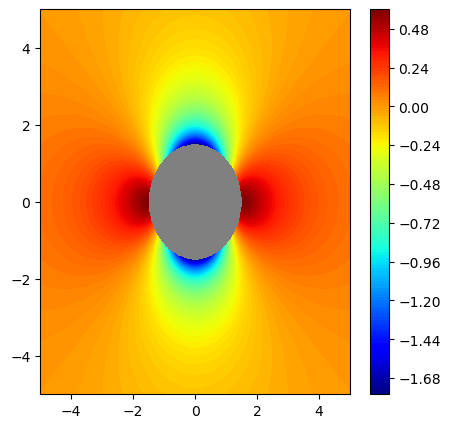

In [45]:
import numpy as np
import matplotlib.pyplot as plt
from numpy import sin,cos

x = np.linspace(-5,5,500) # gridsize
y = np.linspace(-5,5,500)
X,Y = np.meshgrid(x,y)

U = 1 # flow velocity
R = 1.5 # radius of the cylinder
rho = 1.2 # density of the fluid

r = np.sqrt(X**2+Y**2) # radial distance
theta = np.arctan(Y/X) # angle

P = (0.5*rho*U**2)*(2*(R/r)**2*(cos(theta)**2-sin(theta)**2) - (R/r)**4)
P[r<R] = np.nan

plt.figure(figsize=(5,5),dpi=100)
circle1 = plt.Circle((0,0),R,color='grey')
plt.gca().add_patch(circle1)

plt.contourf(X,Y,P,150,cmap='jet')
plt.colorbar()